# **Imports**

In [35]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [36]:
from IPython.display import clear_output
!pip install tf_explain
clear_output()

In [37]:
# common
import os
import keras
import numpy as np
import pandas as pd
from glob import glob
import tensorflow as tf
import tensorflow.image as tfi

# Data
from keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.utils import to_categorical

# Data Viz
import matplotlib.pyplot as plt

# Model
from keras.models import Model
from keras.layers import Layer
from keras.layers import Conv2D
from keras.layers import Dropout
from keras.layers import UpSampling2D
from keras.layers import concatenate
from keras.layers import Add
from keras.layers import Multiply
from keras.layers import Input
from keras.layers import MaxPool2D
from keras.layers import BatchNormalization

# Callbacks
from keras.callbacks import Callback
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
from tf_explain.core.grad_cam import GradCAM

# Metrics
from keras.metrics import MeanIoU

# **Data**

In [38]:
def load_image(image, SIZE):
    return np.round(tfi.resize(img_to_array(load_img(image))/255.,(SIZE, SIZE)),4)

def load_images(image_paths, SIZE, mask=False, trim=None):
    if trim is not None:
        image_paths = image_paths[:trim]

    if mask:
        images = np.zeros(shape=(len(image_paths), SIZE, SIZE, 1))
    else:
        images = np.zeros(shape=(len(image_paths), SIZE, SIZE, 3))

    for i,image in enumerate(image_paths):
        img = load_image(image,SIZE)
        if mask:
            images[i] = img[:,:,:1]
        else:
            images[i] = img

    return images

In [39]:
def show_image(image, title=None, cmap=None, alpha=1):
    plt.imshow(image, cmap=cmap, alpha=alpha)
    if title is not None:
        plt.title(title)
    plt.axis('off')

def show_mask(image, mask, cmap=None, alpha=0.4):
    plt.imshow(image)
    plt.imshow(tf.squeeze(mask), cmap=cmap, alpha=alpha)
    plt.axis('off')

In [40]:
SIZE = 256

In [41]:
root_path = '/content/drive/MyDrive/BreastCancer/Dataset_BUSI_with_GT/'
classes = sorted(os.listdir(root_path))
classes

['benign', 'malignant', 'normal']

In [42]:
single_mask_paths = sorted([sorted(glob(root_path + name + "/*mask.png")) for name in classes])
double_mask_paths = sorted([sorted(glob(root_path + name + "/*mask_1.png")) for name in classes])

In [43]:
image_paths = []
mask_paths = []
for class_path in single_mask_paths:
    for path in class_path:
        img_path = path.replace('_mask','')
        image_paths.append(img_path)
        mask_paths.append(path)

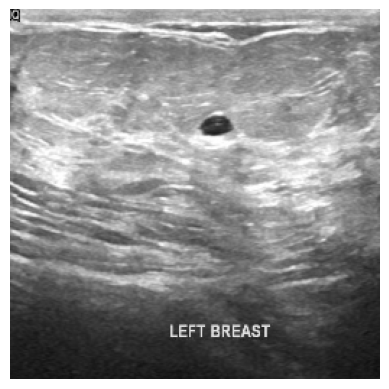

In [44]:
show_image(load_image(image_paths[0], SIZE))

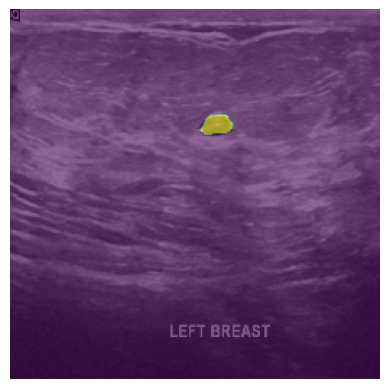

In [45]:
show_mask(load_image(image_paths[0], SIZE), load_image(mask_paths[0], SIZE)[:,:,0], alpha=0.6)

## **Approach**

Below here I have explained my strategy to tackel the multiple mask Images.

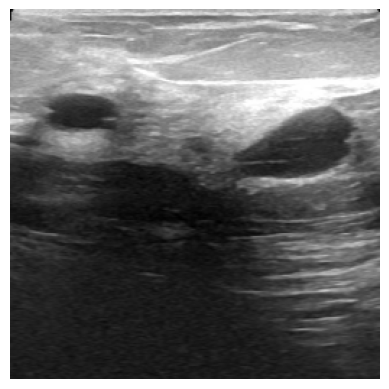

In [46]:
show_image(load_image('/content/drive/MyDrive/BreastCancer/Dataset_BUSI_with_GT/benign/benign (100).png', SIZE))

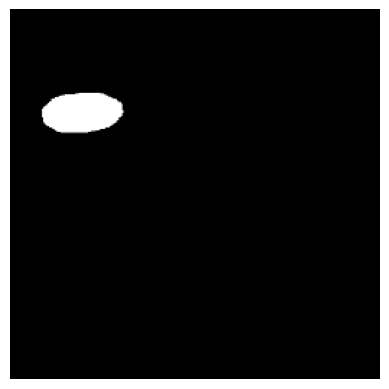

In [47]:
show_image(load_image('/content/drive/MyDrive/BreastCancer/Dataset_BUSI_with_GT/benign/benign (100)_mask_1.png', SIZE))

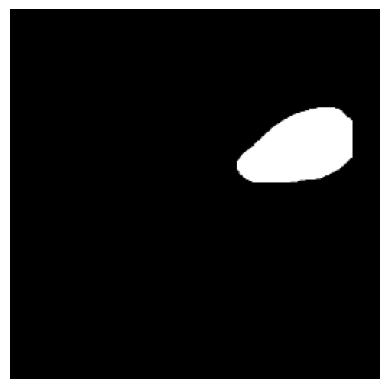

In [48]:
show_image(load_image('/content/drive/MyDrive/BreastCancer/Dataset_BUSI_with_GT/benign/benign (100)_mask.png', SIZE))

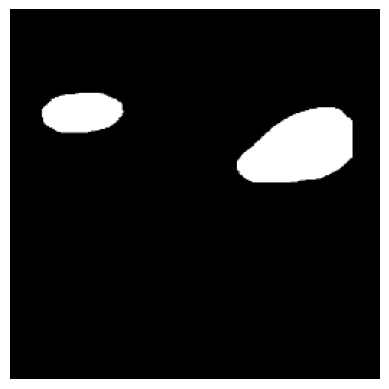

In [49]:
img = np.zeros((1,SIZE,SIZE,3))
mask1 = load_image('/content/drive/MyDrive/BreastCancer/Dataset_BUSI_with_GT/benign/benign (100)_mask_1.png', SIZE)
mask2 = load_image('/content/drive/MyDrive/BreastCancer/Dataset_BUSI_with_GT/benign/benign (100)_mask.png', SIZE)

img = img + mask1 + mask2
img = img[0,:,:,0]
show_image(img, cmap='gray')

We first merged them and them simple used the 1st channel because that is enough.

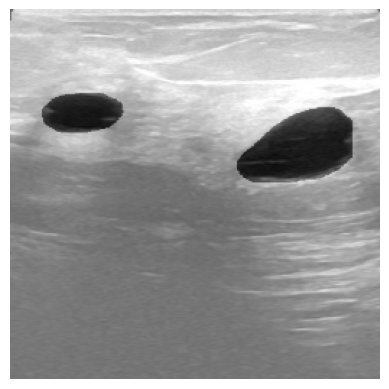

In [50]:
show_image(load_image('/content/drive/MyDrive/BreastCancer/Dataset_BUSI_with_GT/benign/benign (100).png', SIZE))
plt.imshow(img, cmap='binary', alpha=0.4)
plt.axis('off')
plt.show()

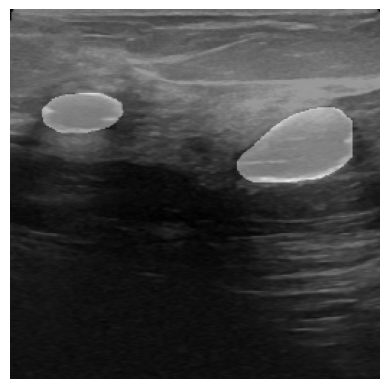

In [51]:
show_image(load_image('/content/drive/MyDrive/BreastCancer/Dataset_BUSI_with_GT/benign/benign (100).png', SIZE))
plt.imshow(img, cmap='gray', alpha=0.4)
plt.axis('off')
plt.show()

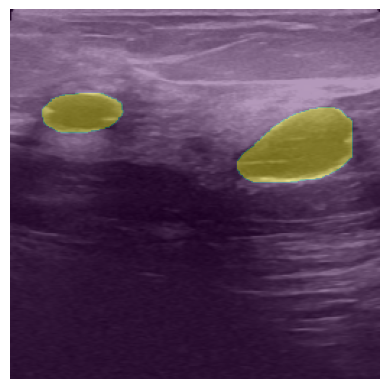

In [52]:
show_image(load_image('/content/drive/MyDrive/BreastCancer/Dataset_BUSI_with_GT/benign/benign (100).png', SIZE))
plt.imshow(img, alpha=0.4)
plt.axis('off')
plt.show()

This is how it looks with different cmaps. But you can drop them as then are very less in number (i.e 16) and this will not affect training much.

## **Data Work**

In [53]:
images = load_images(image_paths, SIZE)
masks = load_images(mask_paths, SIZE, mask=True)

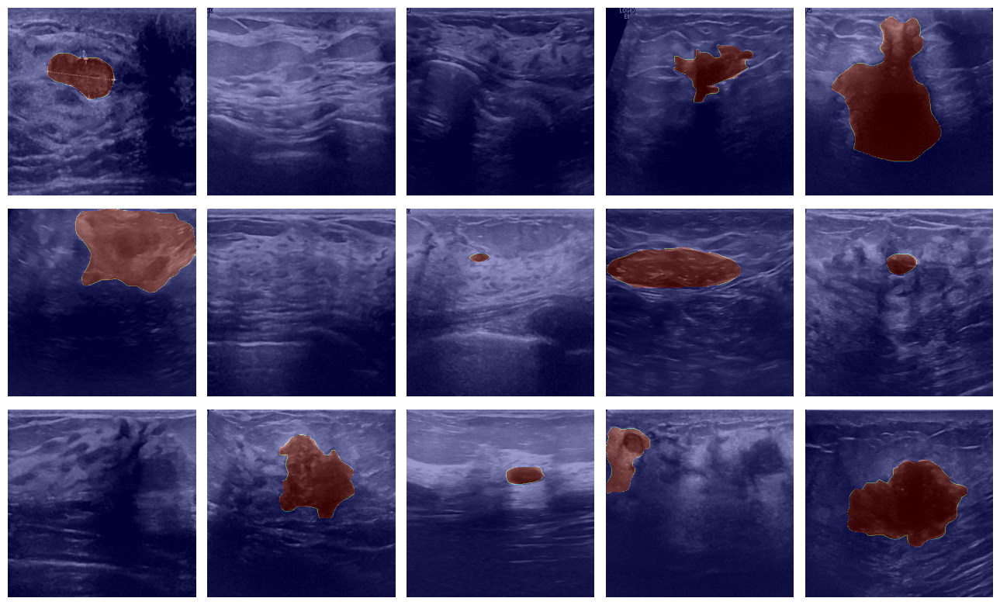

In [54]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='jet')
plt.tight_layout()
plt.show()

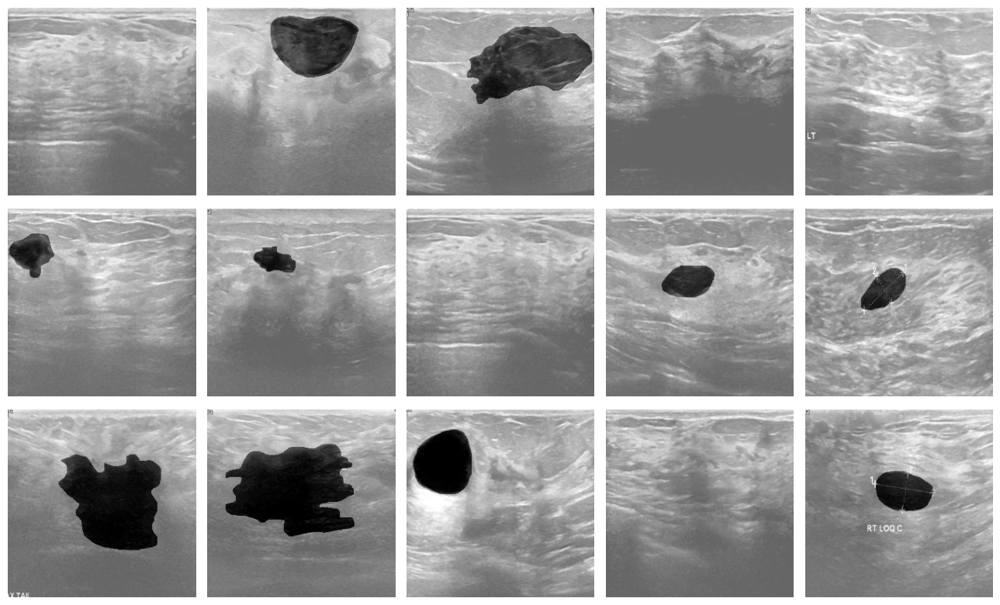

In [55]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='binary')
plt.tight_layout()
plt.show()

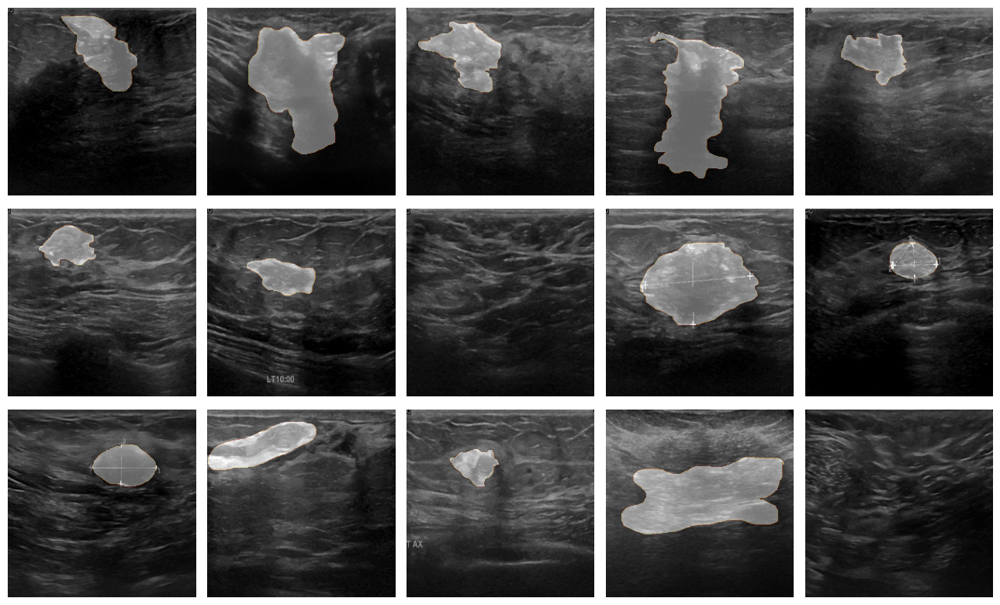

In [56]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='afmhot')
plt.tight_layout()
plt.show()

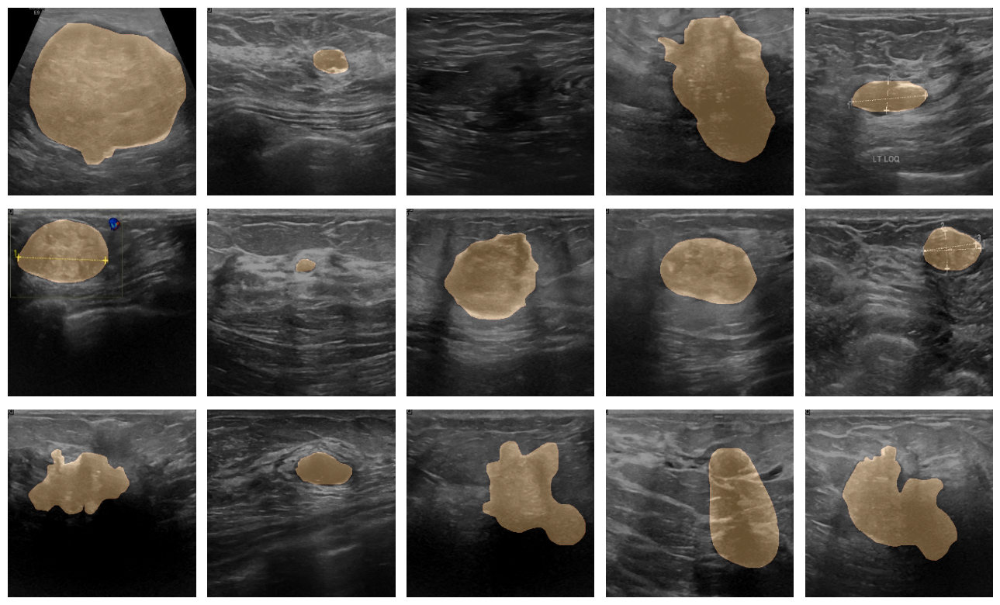

In [57]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='copper')
plt.tight_layout()
plt.show()

# **Encoder**

In [58]:
class EncoderBlock(Layer):

    def __init__(self, filters, rate, pooling=True, **kwargs):
        super(EncoderBlock, self).__init__(**kwargs)

        self.filters = filters
        self.rate = rate
        self.pooling = pooling

        self.c1 = Conv2D(filters, kernel_size=3, strides=1, padding='same', activation='relu', kernel_initializer='he_normal')
        self.drop = Dropout(rate)
        self.c2 = Conv2D(filters, kernel_size=3, strides=1, padding='same', activation='relu', kernel_initializer='he_normal')
        self.pool = MaxPool2D()

    def call(self, X):
        x = self.c1(X)
        x = self.drop(x)
        x = self.c2(x)
        if self.pooling:
            y = self.pool(x)
            return y, x
        else:
            return x

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            'rate':self.rate,
            'pooling':self.pooling
        }

# **Decoder**

In [59]:
class DecoderBlock(Layer):

    def __init__(self, filters, rate, **kwargs):
        super(DecoderBlock, self).__init__(**kwargs)

        self.filters = filters
        self.rate = rate

        self.up = UpSampling2D()
        self.net = EncoderBlock(filters, rate, pooling=False)

    def call(self, X):
        X, skip_X = X
        x = self.up(X)
        c_ = concatenate([x, skip_X])
        x = self.net(c_)
        return x

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            'rate':self.rate,
        }

# **Attention Gate**

In [60]:
class AttentionGate(Layer):

    def __init__(self, filters, bn, **kwargs):
        super(AttentionGate, self).__init__(**kwargs)

        self.filters = filters
        self.bn = bn

        self.normal = Conv2D(filters, kernel_size=3, padding='same', activation='relu', kernel_initializer='he_normal')
        self.down = Conv2D(filters, kernel_size=3, strides=2, padding='same', activation='relu', kernel_initializer='he_normal')
        self.learn = Conv2D(1, kernel_size=1, padding='same', activation='sigmoid')
        self.resample = UpSampling2D()
        self.BN = BatchNormalization()

    def call(self, X):
        X, skip_X = X

        x = self.normal(X)
        skip = self.down(skip_X)
        x = Add()([x, skip])
        x = self.learn(x)
        x = self.resample(x)
        f = Multiply()([x, skip_X])
        if self.bn:
            return self.BN(f)
        else:
            return f
        # return f

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            "bn":self.bn
        }

# **Custom Callback**

In [61]:
class ShowProgress(Callback):
    def on_epoch_end(self, epochs, logs=None):
        id = np.random.randint(200)
        exp = GradCAM()
        image = images[id]
        mask = masks[id]
        pred_mask = self.model.predict(image[np.newaxis,...])
        cam = exp.explain(
            validation_data=(image[np.newaxis,...], mask),
            class_index=1,
            layer_name='Attention4',
            model=self.model
        )

        plt.figure(figsize=(10,5))

        plt.subplot(1,3,1)
        plt.title("Original Mask")
        show_mask(image, mask, cmap='copper')

        plt.subplot(1,3,2)
        plt.title("Predicted Mask")
        show_mask(image, pred_mask, cmap='copper')

        plt.subplot(1,3,3)
        show_image(cam,title="GradCAM")

        plt.tight_layout()
        plt.show()

# **Attention UNet**

In [62]:
# Inputs
input_layer = Input(shape=images.shape[-3:])

# Encoder
p1, c1 = EncoderBlock(32,0.1, name="Encoder1")(input_layer)
p2, c2 = EncoderBlock(64,0.1, name="Encoder2")(p1)
p3, c3 = EncoderBlock(128,0.2, name="Encoder3")(p2)
p4, c4 = EncoderBlock(256,0.2, name="Encoder4")(p3)

# Encoding
encoding = EncoderBlock(512,0.3, pooling=False, name="Encoding")(p4)

# Attention + Decoder

a1 = AttentionGate(256, bn=True, name="Attention1")([encoding, c4])
d1 = DecoderBlock(256,0.2, name="Decoder1")([encoding, a1])

a2 = AttentionGate(128, bn=True, name="Attention2")([d1, c3])
d2 = DecoderBlock(128,0.2, name="Decoder2")([d1, a2])

a3 = AttentionGate(64, bn=True, name="Attention3")([d2, c2])
d3 = DecoderBlock(64,0.1, name="Decoder3")([d2, a3])


a4 = AttentionGate(32, bn=True, name="Attention4")([d3, c1])
d4 = DecoderBlock(32,0.1, name="Decoder4")([d3, a4])

# Output
output_layer = Conv2D(1, kernel_size=1, activation='sigmoid', padding='same')(d4)

# Model
model = Model(
    inputs=[input_layer],
    outputs=[output_layer]
)

# Compile
model.compile(
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=['accuracy', MeanIoU(num_classes=2, name='IoU')]
)

# Callbacks
cb = [
    # EarlyStopping(patience=3, restore_best_weight=True), # With Segmentation I trust on eyes rather than on metrics
    ModelCheckpoint("AttentionCustomUNet.h5", save_best_only=True),
    ShowProgress()
]

# **Training**

Epoch 1/15
1/1 [==============================] - 0s 392ms/step


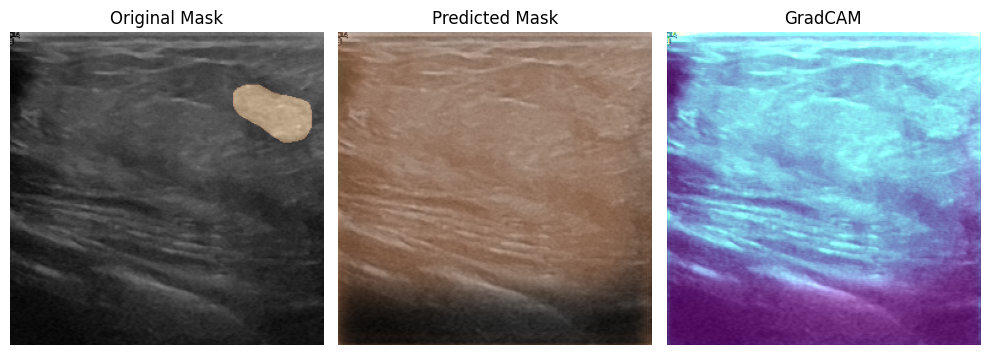

97/97 [==============================] - 53s 375ms/step - loss: 0.8983 - accuracy: 0.9078 - IoU: 0.4554 - val_loss: 0.3708 - val_accuracy: 0.9813 - val_IoU: 0.4909
Epoch 2/15
1/1 [==============================] - 0s 24ms/step


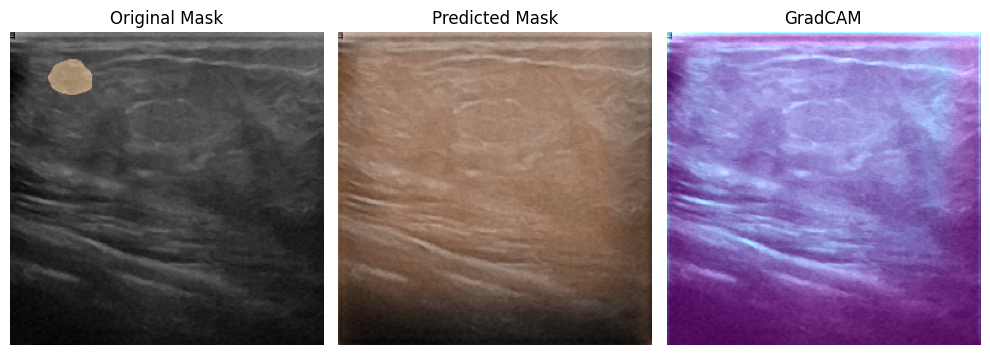

97/97 [==============================] - 29s 300ms/step - loss: 0.2327 - accuracy: 0.9112 - IoU: 0.4537 - val_loss: 0.2860 - val_accuracy: 0.9813 - val_IoU: 0.4909
Epoch 3/15
1/1 [==============================] - 0s 189ms/step


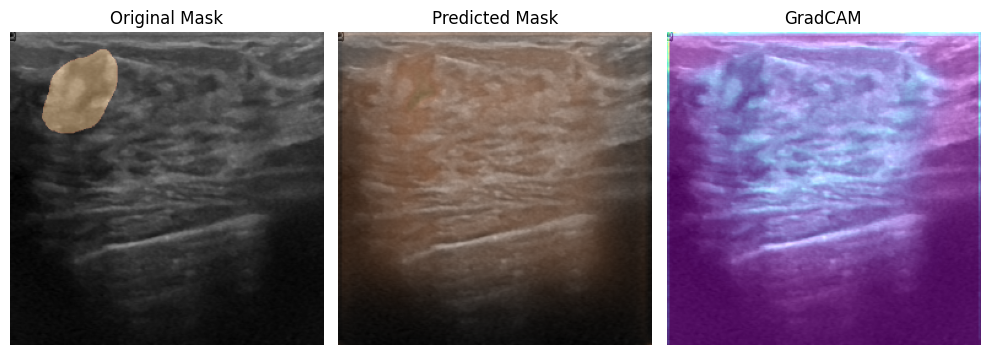

97/97 [==============================] - 30s 310ms/step - loss: 0.2134 - accuracy: 0.9213 - IoU: 0.4539 - val_loss: 0.1622 - val_accuracy: 0.9813 - val_IoU: 0.4909
Epoch 4/15
1/1 [==============================] - 0s 33ms/step


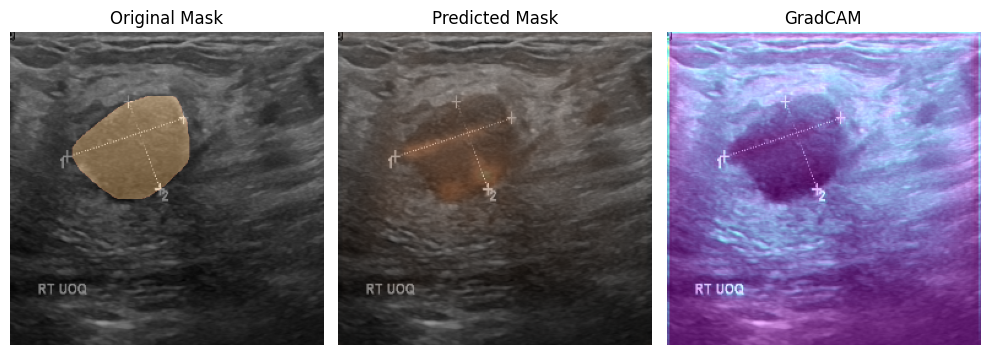

97/97 [==============================] - 29s 300ms/step - loss: 0.1942 - accuracy: 0.9268 - IoU: 0.4559 - val_loss: 0.1249 - val_accuracy: 0.9814 - val_IoU: 0.4909
Epoch 5/15
1/1 [==============================] - 0s 23ms/step


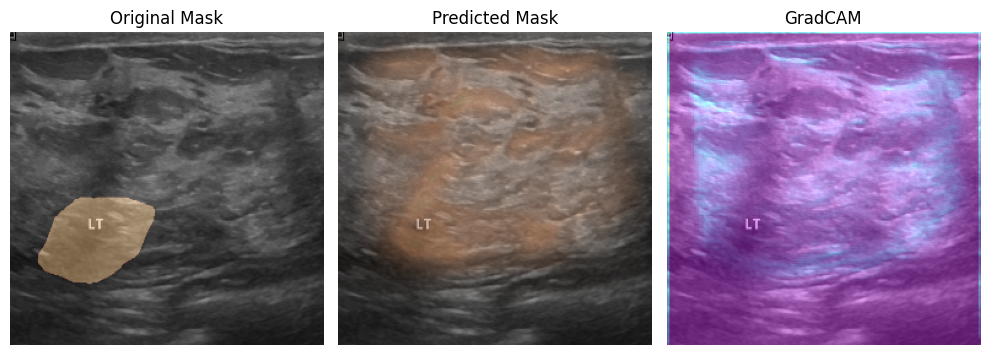

97/97 [==============================] - 28s 291ms/step - loss: 0.1986 - accuracy: 0.9262 - IoU: 0.4535 - val_loss: 0.2491 - val_accuracy: 0.9109 - val_IoU: 0.4909
Epoch 6/15
1/1 [==============================] - 0s 20ms/step


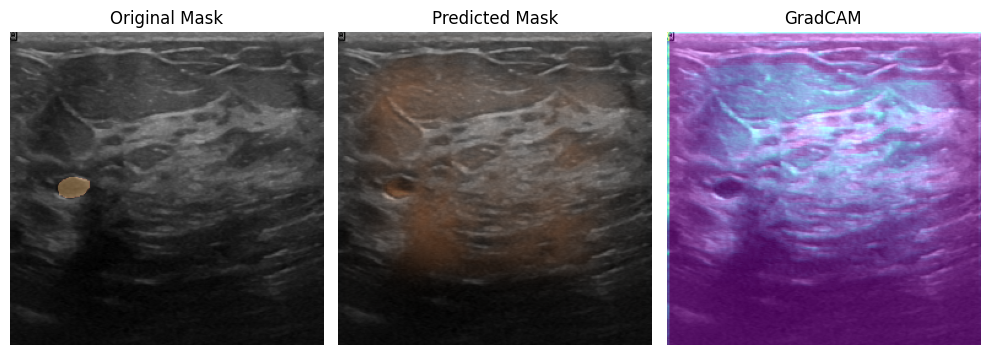

97/97 [==============================] - 29s 298ms/step - loss: 0.1893 - accuracy: 0.9317 - IoU: 0.4564 - val_loss: 0.0768 - val_accuracy: 0.9813 - val_IoU: 0.4909
Epoch 7/15
1/1 [==============================] - 0s 33ms/step


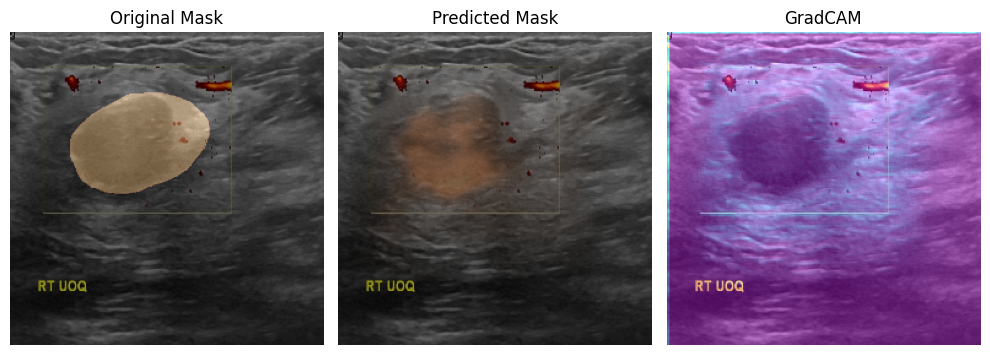

97/97 [==============================] - 29s 300ms/step - loss: 0.1852 - accuracy: 0.9309 - IoU: 0.4553 - val_loss: 0.0674 - val_accuracy: 0.9821 - val_IoU: 0.4909
Epoch 8/15
1/1 [==============================] - 0s 34ms/step


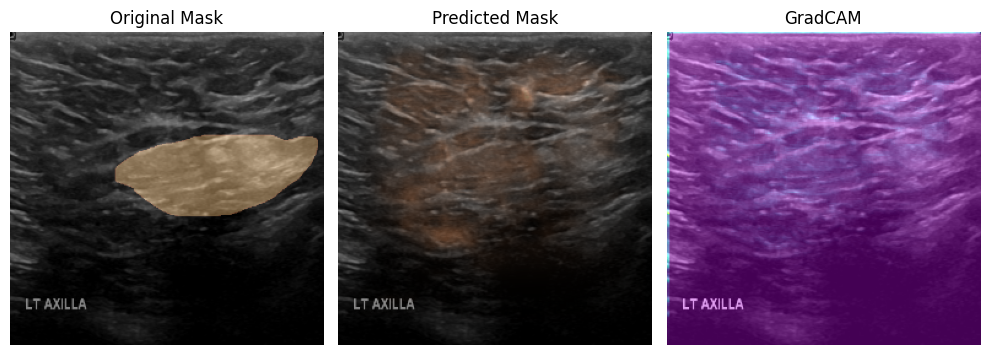

97/97 [==============================] - 28s 292ms/step - loss: 0.1783 - accuracy: 0.9341 - IoU: 0.4544 - val_loss: 0.0897 - val_accuracy: 0.9811 - val_IoU: 0.4909
Epoch 9/15
1/1 [==============================] - 0s 21ms/step


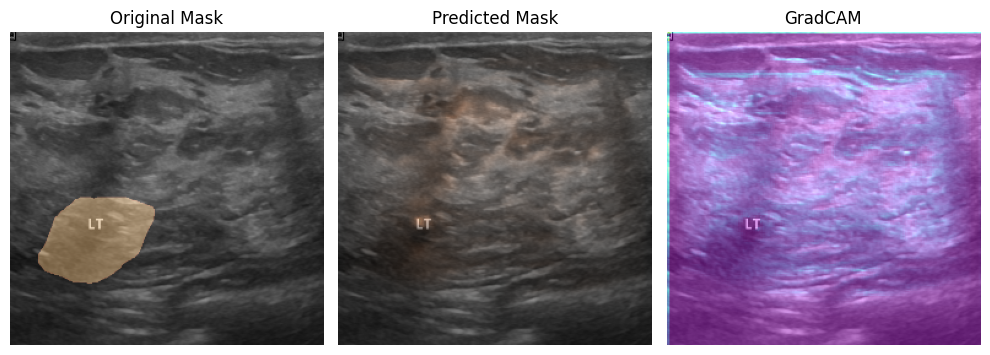

97/97 [==============================] - 28s 291ms/step - loss: 0.1740 - accuracy: 0.9348 - IoU: 0.4540 - val_loss: 0.0862 - val_accuracy: 0.9835 - val_IoU: 0.4909
Epoch 10/15
1/1 [==============================] - 0s 21ms/step


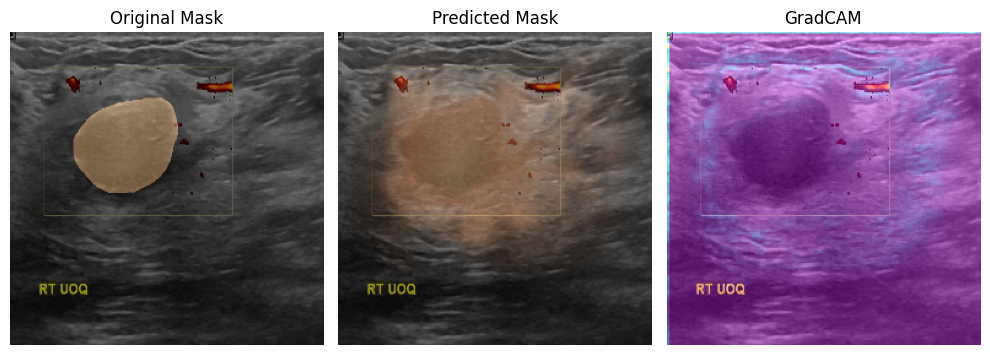

97/97 [==============================] - 28s 291ms/step - loss: 0.1695 - accuracy: 0.9366 - IoU: 0.4554 - val_loss: 0.1665 - val_accuracy: 0.9469 - val_IoU: 0.4909
Epoch 11/15
1/1 [==============================] - 0s 41ms/step


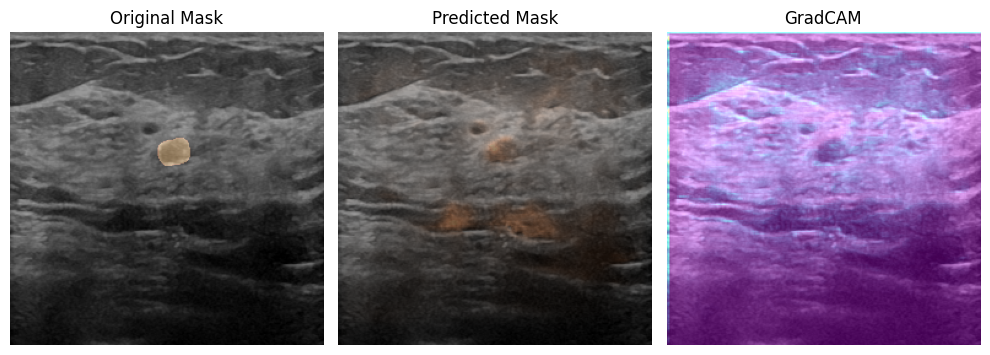

97/97 [==============================] - 28s 292ms/step - loss: 0.1658 - accuracy: 0.9405 - IoU: 0.4547 - val_loss: 0.0758 - val_accuracy: 0.9824 - val_IoU: 0.4909
Epoch 12/15
1/1 [==============================] - 0s 21ms/step


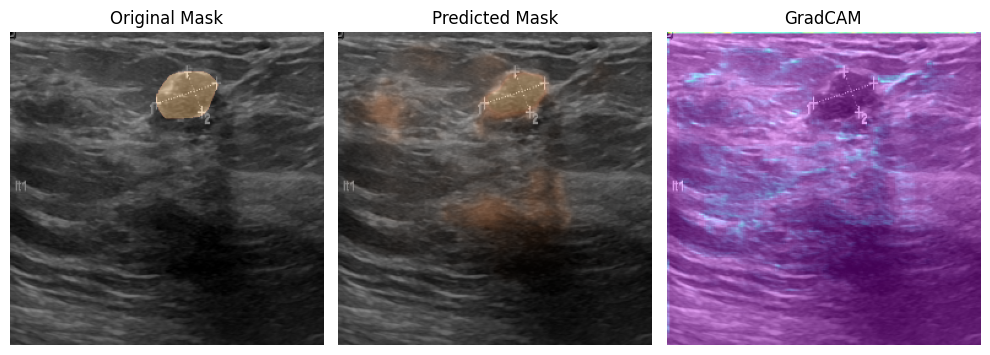

97/97 [==============================] - 28s 292ms/step - loss: 0.1682 - accuracy: 0.9395 - IoU: 0.4558 - val_loss: 0.0906 - val_accuracy: 0.9744 - val_IoU: 0.4909
Epoch 13/15
 6/97 [>.............................] - ETA: 24s - loss: 0.1417 - accuracy: 0.9507 - IoU: 0.4569

1/1 [==============================] - 0s 44ms/step


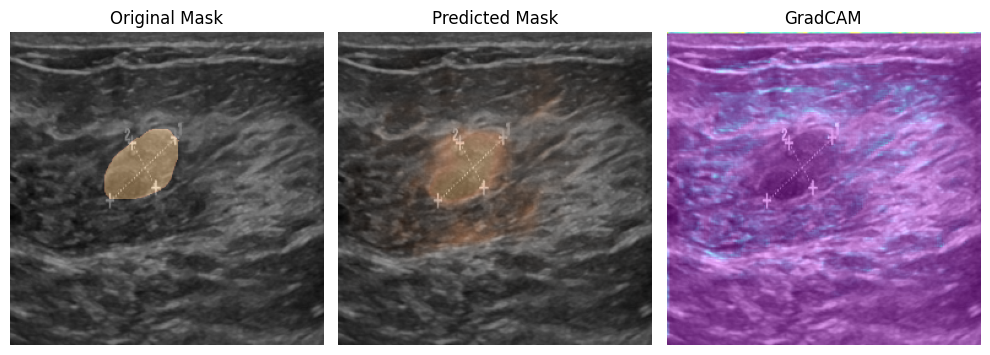

97/97 [==============================] - 4s 39ms/step - loss: 0.1417 - accuracy: 0.9507 - IoU: 0.4569 - val_loss: 0.0734 - val_accuracy: 0.9829 - val_IoU: 0.4909


In [63]:
# Config Training
BATCH_SIZE = 8
SPE = len(images)//BATCH_SIZE

# Training
results = model.fit(
    images, masks,
    validation_split=0.2,
    epochs=15, # 15 will be enough for a good Model for better model go with 20+
    steps_per_epoch=SPE,
    batch_size=BATCH_SIZE,
    callbacks=cb
)

**Observations :**

* After **12 epochs** model started outputting what we needed.
* The model was easily able to detect **black round spots but fails when the shape is irregular**(Not the case with current model because it is trained with hight SPE).

* It also gets confused between the dark areas, which makes sense.

---
**Suggestion :**
* Do training in chunks of **20 Epochs**, this will give you a good control **over model and the model will also perform well**.

* Here the model is trained on 17 + 17 + 17 = 51 Epochs.

* If you give the model a closer look n different images you will find that the model fails at some images, but I can garantee that 9/10 such images would be so tough that even a human will not be a able to detect as many parts of the image look the same.


# **Evaluation**

In [64]:
loss, accuracy, iou, val_loss, val_accuracy, val_iou = results.history.values()

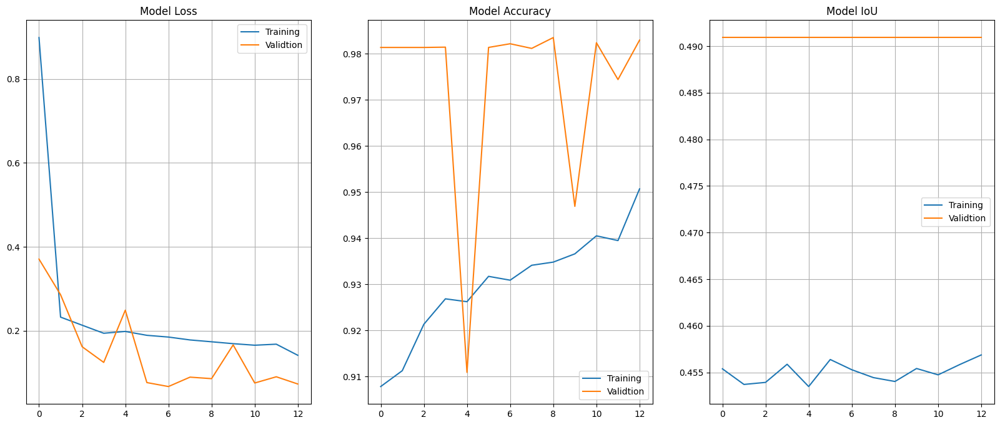

In [65]:
plt.figure(figsize=(20,8))

plt.subplot(1,3,1)
plt.title("Model Loss")
plt.plot(loss, label="Training")
plt.plot(val_loss, label="Validtion")
plt.legend()
plt.grid()

plt.subplot(1,3,2)
plt.title("Model Accuracy")
plt.plot(accuracy, label="Training")
plt.plot(val_accuracy, label="Validtion")
plt.legend()
plt.grid()

plt.subplot(1,3,3)
plt.title("Model IoU")
plt.plot(iou, label="Training")
plt.plot(val_iou, label="Validtion")
plt.legend()
plt.grid()

plt.show()

Suprisingly the results on **Validation Data** are **way better** than the results on **Trainind Data** on **IoU**, this may indicate that the **model can perform way better** than what it can do at the current point. The **Loss is not Perfect** it increases in the last but the model constructions are loooking perfect as this point, that's why **I believe in what I see**. This model seems promising, let's try it on some Images.

Epoch 1/15
1/1 [==============================] - 0s 482ms/step


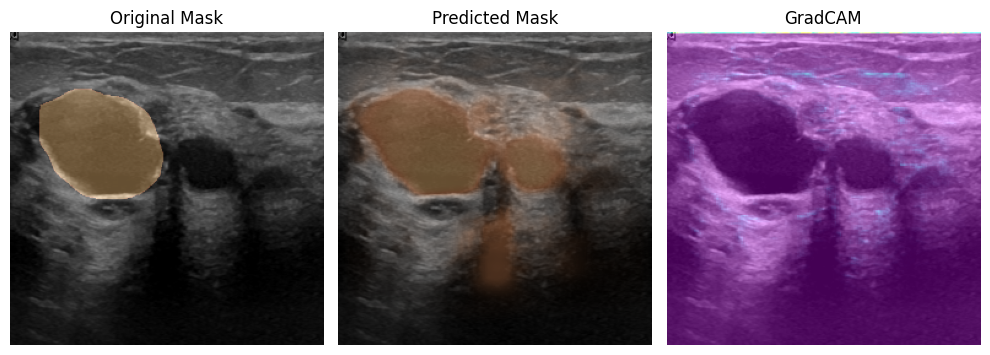

97/97 [==============================] - 44s 325ms/step - loss: 0.1673 - accuracy: 0.9400 - IoU: 0.4544 - precision: 0.7762 - recall: 0.5181 - auc: 0.9225 - f1_score: 0.6044 - val_loss: 0.2293 - val_accuracy: 0.9036 - val_IoU: 0.4909 - val_precision: 0.1321 - val_recall: 0.7452 - val_auc: 0.9175 - val_f1_score: 0.0848
Epoch 2/15
1/1 [==============================] - 0s 37ms/step


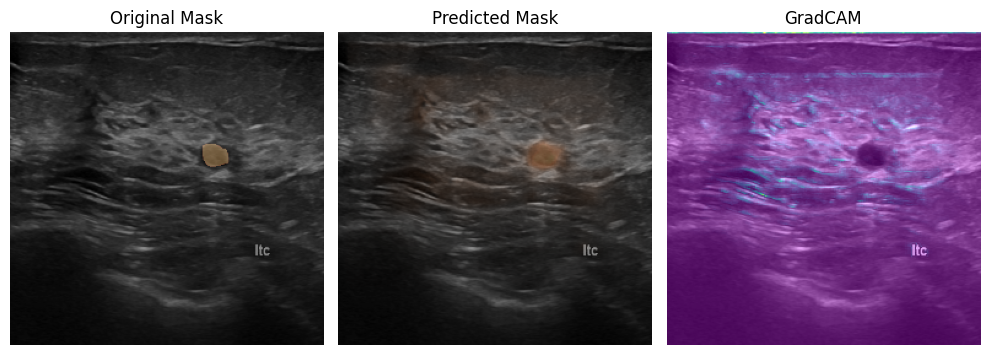

97/97 [==============================] - 30s 309ms/step - loss: 0.1583 - accuracy: 0.9421 - IoU: 0.4554 - precision: 0.7746 - recall: 0.5318 - auc: 0.9304 - f1_score: 0.6110 - val_loss: 0.0717 - val_accuracy: 0.9850 - val_IoU: 0.4909 - val_precision: 0.7900 - val_recall: 0.2677 - val_auc: 0.9095 - val_f1_score: 0.0627
Epoch 3/15
1/1 [==============================] - 0s 31ms/step


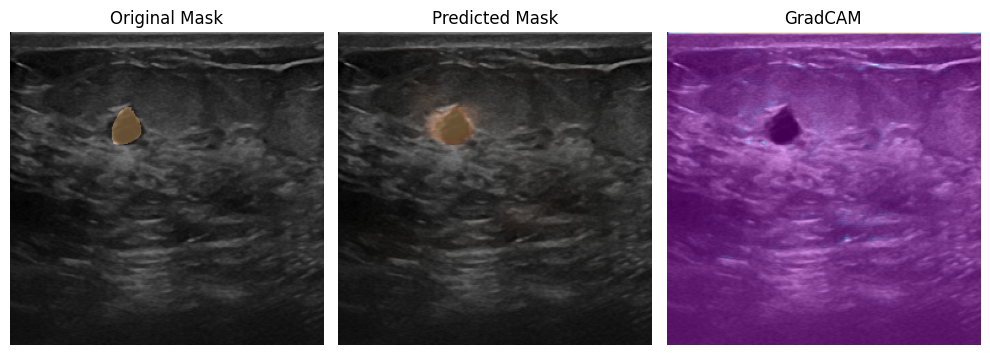

97/97 [==============================] - 29s 297ms/step - loss: 0.1442 - accuracy: 0.9477 - IoU: 0.4545 - precision: 0.8030 - recall: 0.5943 - auc: 0.9411 - f1_score: 0.6756 - val_loss: 0.0536 - val_accuracy: 0.9861 - val_IoU: 0.4909 - val_precision: 0.8549 - val_recall: 0.3072 - val_auc: 0.9202 - val_f1_score: 0.0698
Epoch 4/15
1/1 [==============================] - 0s 23ms/step


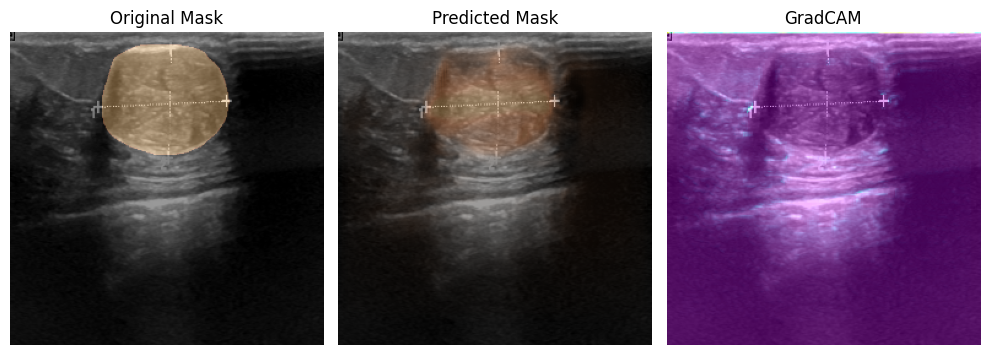

97/97 [==============================] - 28s 290ms/step - loss: 0.1412 - accuracy: 0.9484 - IoU: 0.4555 - precision: 0.8128 - recall: 0.5842 - auc: 0.9438 - f1_score: 0.6716 - val_loss: 0.0947 - val_accuracy: 0.9833 - val_IoU: 0.4909 - val_precision: 0.9376 - val_recall: 0.1135 - val_auc: 0.8616 - val_f1_score: 0.0304
Epoch 5/15
1/1 [==============================] - 0s 22ms/step


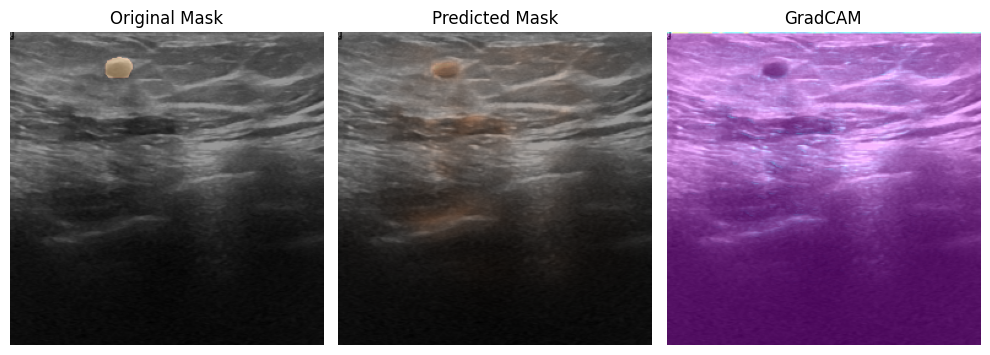

97/97 [==============================] - 28s 291ms/step - loss: 0.1486 - accuracy: 0.9462 - IoU: 0.4541 - precision: 0.8042 - recall: 0.5886 - auc: 0.9424 - f1_score: 0.6683 - val_loss: 0.0706 - val_accuracy: 0.9821 - val_IoU: 0.4909 - val_precision: 0.5240 - val_recall: 0.5400 - val_auc: 0.9319 - val_f1_score: 0.0949
Epoch 6/15
1/1 [==============================] - 0s 30ms/step


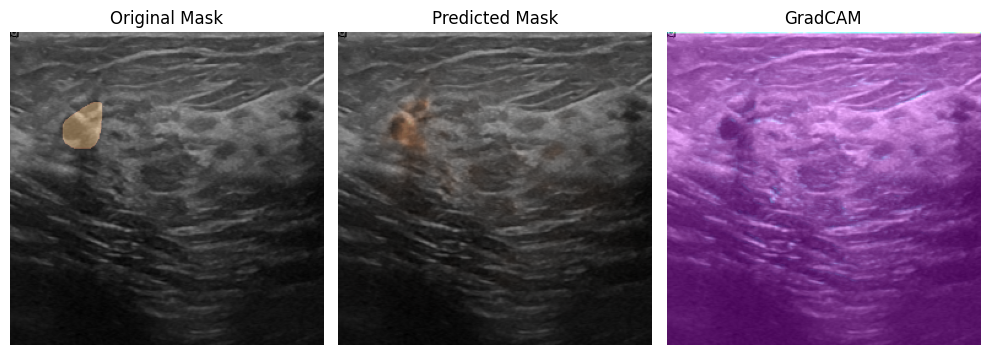

97/97 [==============================] - 30s 305ms/step - loss: 0.1332 - accuracy: 0.9508 - IoU: 0.4562 - precision: 0.8112 - recall: 0.6101 - auc: 0.9502 - f1_score: 0.6855 - val_loss: 0.0570 - val_accuracy: 0.9852 - val_IoU: 0.4909 - val_precision: 0.7187 - val_recall: 0.3412 - val_auc: 0.9129 - val_f1_score: 0.0740
Epoch 7/15
1/1 [==============================] - 0s 34ms/step


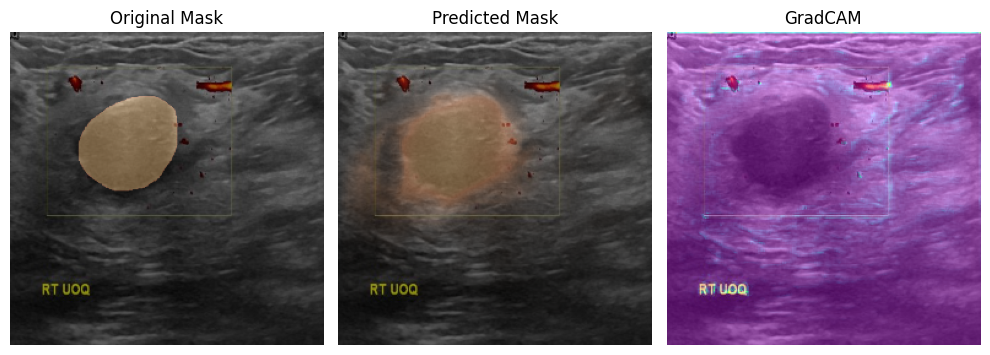

97/97 [==============================] - 30s 306ms/step - loss: 0.1303 - accuracy: 0.9521 - IoU: 0.4562 - precision: 0.8047 - recall: 0.6419 - auc: 0.9531 - f1_score: 0.7037 - val_loss: 0.0741 - val_accuracy: 0.9800 - val_IoU: 0.4909 - val_precision: 0.4754 - val_recall: 0.6034 - val_auc: 0.9373 - val_f1_score: 0.1032
Epoch 8/15
1/1 [==============================] - 0s 22ms/step


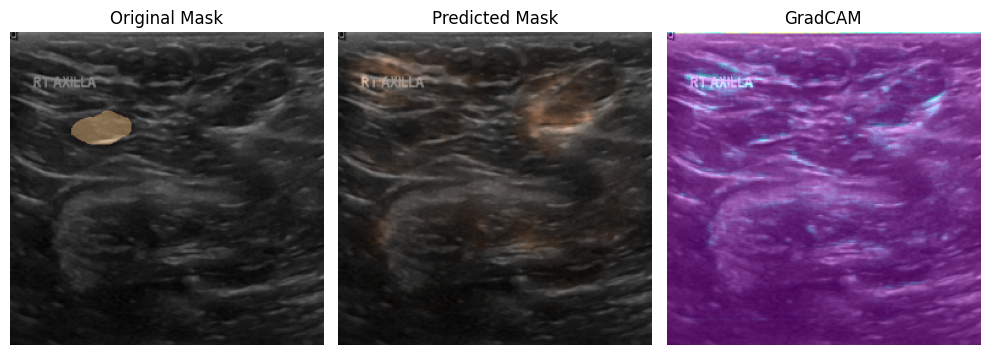

97/97 [==============================] - 28s 289ms/step - loss: 0.1333 - accuracy: 0.9512 - IoU: 0.4555 - precision: 0.8241 - recall: 0.6168 - auc: 0.9515 - f1_score: 0.6979 - val_loss: 0.0600 - val_accuracy: 0.9848 - val_IoU: 0.4909 - val_precision: 0.6575 - val_recall: 0.3931 - val_auc: 0.9310 - val_f1_score: 0.0809
Epoch 9/15
1/1 [==============================] - 0s 21ms/step


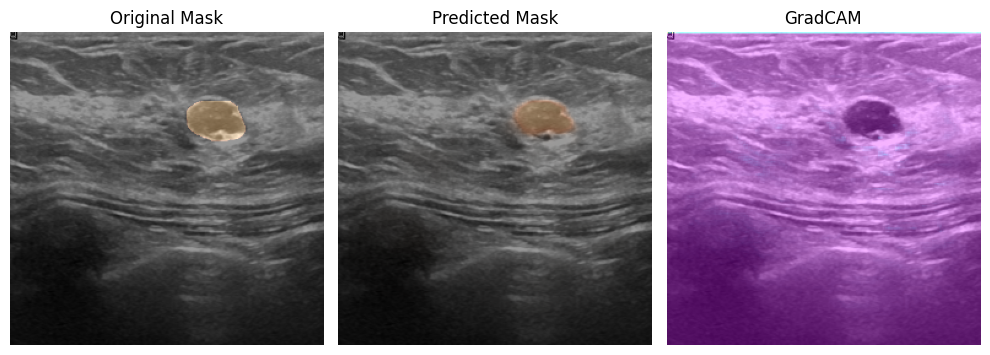

97/97 [==============================] - 28s 289ms/step - loss: 0.1288 - accuracy: 0.9526 - IoU: 0.4545 - precision: 0.8161 - recall: 0.6573 - auc: 0.9567 - f1_score: 0.7177 - val_loss: 0.0540 - val_accuracy: 0.9833 - val_IoU: 0.4909 - val_precision: 0.9220 - val_recall: 0.1152 - val_auc: 0.9363 - val_f1_score: 0.0311
Epoch 10/15
1/1 [==============================] - 0s 35ms/step


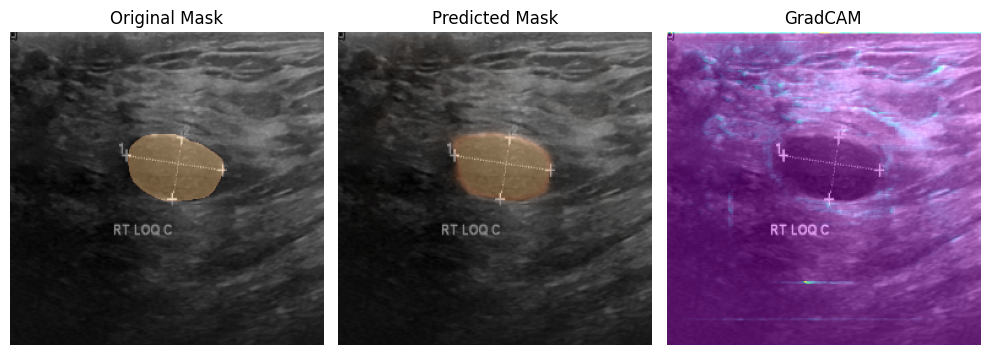

97/97 [==============================] - 28s 292ms/step - loss: 0.1163 - accuracy: 0.9561 - IoU: 0.4576 - precision: 0.8275 - recall: 0.6533 - auc: 0.9623 - f1_score: 0.7261 - val_loss: 0.0807 - val_accuracy: 0.9699 - val_IoU: 0.4909 - val_precision: 0.3471 - val_recall: 0.6822 - val_auc: 0.9439 - val_f1_score: 0.1007
Epoch 11/15
1/1 [==============================] - 0s 33ms/step


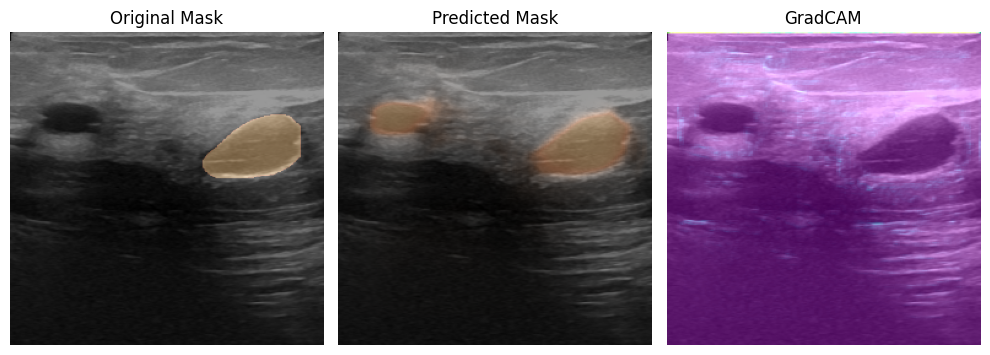

97/97 [==============================] - 28s 292ms/step - loss: 0.1173 - accuracy: 0.9556 - IoU: 0.4541 - precision: 0.8346 - recall: 0.6890 - auc: 0.9659 - f1_score: 0.7440 - val_loss: 0.0782 - val_accuracy: 0.9797 - val_IoU: 0.4909 - val_precision: 0.4702 - val_recall: 0.6078 - val_auc: 0.9354 - val_f1_score: 0.1010
Epoch 12/15
1/1 [==============================] - 0s 22ms/step


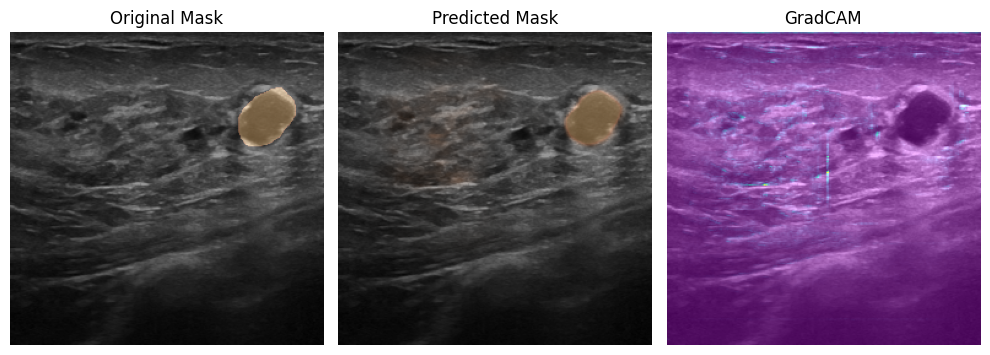

97/97 [==============================] - 28s 290ms/step - loss: 0.1010 - accuracy: 0.9616 - IoU: 0.4578 - precision: 0.8450 - recall: 0.7225 - auc: 0.9738 - f1_score: 0.7656 - val_loss: 0.1265 - val_accuracy: 0.9490 - val_IoU: 0.4909 - val_precision: 0.2239 - val_recall: 0.6980 - val_auc: 0.9365 - val_f1_score: 0.0943
Epoch 13/15
 6/97 [>.............................] - ETA: 24s - loss: 0.1146 - accuracy: 0.9538 - IoU: 0.4587 - precision: 0.7590 - recall: 0.7303 - auc: 0.9702 - f1_score: 0.7170

1/1 [==============================] - 0s 22ms/step


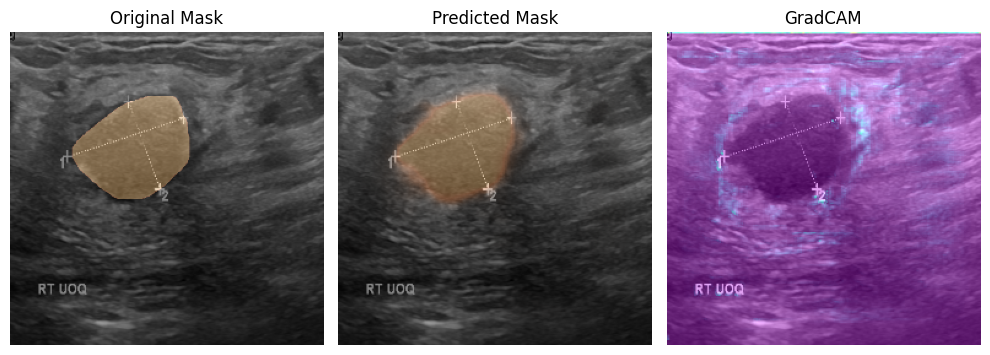

97/97 [==============================] - 4s 38ms/step - loss: 0.1146 - accuracy: 0.9538 - IoU: 0.4587 - precision: 0.7590 - recall: 0.7303 - auc: 0.9702 - f1_score: 0.7170 - val_loss: 0.0563 - val_accuracy: 0.9857 - val_IoU: 0.4909 - val_precision: 0.8865 - val_recall: 0.2688 - val_auc: 0.9362 - val_f1_score: 0.0635


In [66]:
from keras import backend as K
from keras import metrics
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt

def f1_score(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    recall = true_positives / (possible_positives + K.epsilon())
    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val

model.compile(
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=[
        'accuracy',
        MeanIoU(num_classes=2, name='IoU'),
        metrics.Precision(name='precision'),
        metrics.Recall(name='recall'),
        metrics.AUC(name='auc'),
        f1_score
    ]
)

results = model.fit(
    images, masks,
    validation_split=0.2,
    epochs=15,
    steps_per_epoch=SPE,
    batch_size=BATCH_SIZE,
    callbacks=cb
)

1/1 [==============================] - 0s 24ms/step


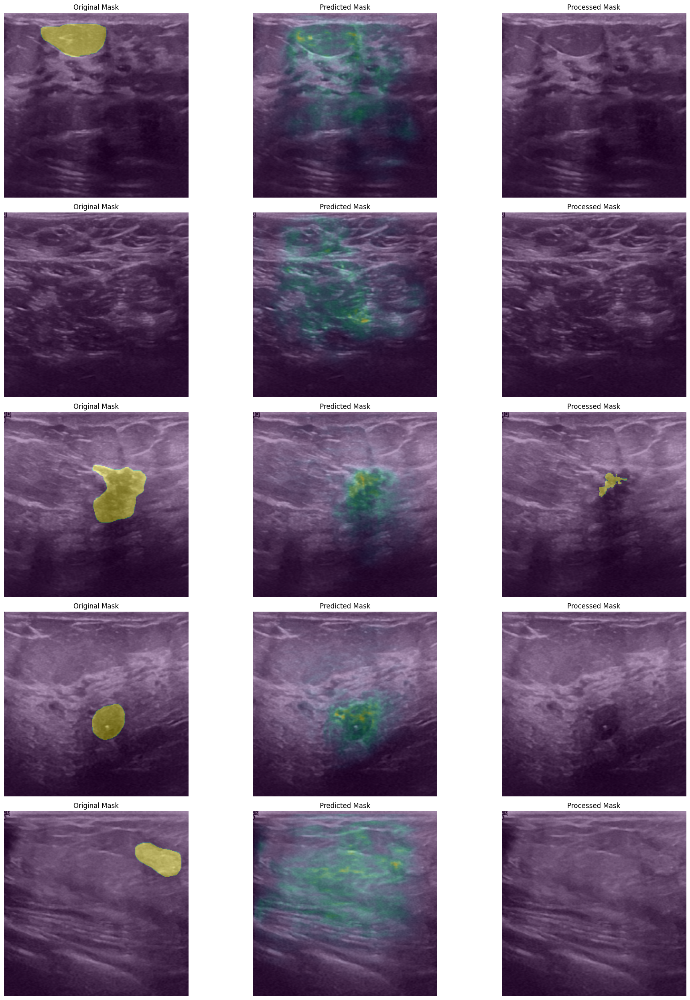

In [67]:
plt.figure(figsize=(20,25))
n=0
for i in range(1,(5*3)+1):
    plt.subplot(5,3,i)
    if n==0:
        id = np.random.randint(len(images))
        image = images[id]
        mask = masks[id]
        pred_mask = model.predict(image[np.newaxis,...])

        plt.title("Original Mask")
        show_mask(image, mask)
        n+=1
    elif n==1:
        plt.title("Predicted Mask")
        show_mask(image, pred_mask)
        n+=1
    elif n==2:
        pred_mask = (pred_mask>0.5).astype('float')
        plt.title("Processed Mask")
        show_mask(image, pred_mask)
        n=0
plt.tight_layout()
plt.show()

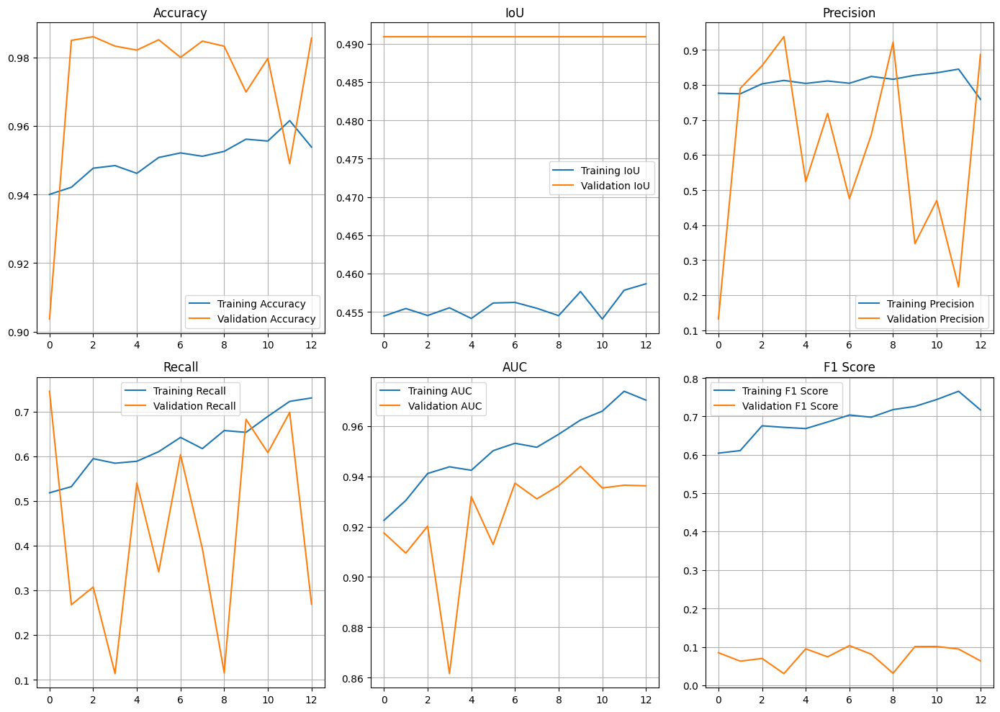

In [68]:
# Plotting the metrics
plt.figure(figsize=(14,10))

plt.subplot(2,3,1)
plt.plot(results.history['accuracy'], label='Training Accuracy')
plt.plot(results.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.grid()
plt.title('Accuracy')

plt.subplot(2,3,2)
plt.plot(results.history['IoU'], label='Training IoU')
plt.plot(results.history['val_IoU'], label='Validation IoU')
plt.legend()
plt.grid()
plt.title('IoU')

plt.subplot(2,3,3)
plt.plot(results.history['precision'], label='Training Precision')
plt.plot(results.history['val_precision'], label='Validation Precision')
plt.legend()
plt.grid()
plt.title('Precision')

plt.subplot(2,3,4)
plt.plot(results.history['recall'], label='Training Recall')
plt.plot(results.history['val_recall'], label='Validation Recall')
plt.legend()
plt.grid()
plt.title('Recall')

plt.subplot(2,3,5)
plt.plot(results.history['auc'], label='Training AUC')
plt.plot(results.history['val_auc'], label='Validation AUC')
plt.legend()
plt.grid()
plt.title('AUC')

plt.subplot(2,3,6)
plt.plot(results.history['f1_score'], label='Training F1 Score')
plt.plot(results.history['val_f1_score'], label='Validation F1 Score')
plt.legend()
plt.grid()
plt.title('F1 Score')

plt.tight_layout()
plt.show()